In [31]:
cd "/content/drive/MyDrive/Human Pose Estimation"

/content/drive/MyDrive/Human Pose Estimation


In [32]:
%matplotlib inline
import numpy as np
import pandas as pd
import os

In [33]:
from keras.engine.saving import load_model
from keras.utils import to_categorical
from keras import Input, Model
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM, Convolution3D, Conv3D, MaxPooling3D, BatchNormalization, Flatten, Conv2D, \
    MaxPooling2D, TimeDistributed, concatenate
from keras.optimizers import SGD, Adam
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.callbacks import EarlyStopping

In [34]:
select_data = []
vector = []

BODY_PARTS = {"Head": 0, "Neck": 1, "RShoulder": 2, "RElbow": 3, "RWrist": 4,
              "LShoulder": 5, "LElbow": 6, "LWrist": 7, "RHip": 8, "RKnee": 9,
              "RAnkle": 10, "LHip": 11, "LKnee": 12, "LAnkle": 13, "Chest": 14}

n_frames = 50
label_count = 0

In [35]:
def draw_history(history):
    plt.plot(history.history['loss'], color='r')
    plt.plot(history.history['val_loss'], color='g')
    plt.plot(history.history['accuracy'], color='b')
    plt.plot(history.history['val_accuracy'], color='k')
    plt.title('Model Acc and Loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'test_loss', 'train_acc', 'test_acc'], loc='upper left')
    plt.savefig("acc_loss.png")
    plt.show()

In [68]:
def lstm_model(x_train=None, y_train=None, x_test=None, y_test=None):
    model = Sequential()
    model.add(LSTM(input_shape=(x_train.shape[1], x_train.shape[2]), units=128))
    model.add(Dropout(0.5))
    model.add(Dense(activation='softmax', units=3))
    model.compile(loss='categorical_crossentropy', optimizer=SGD(lr=0.005), metrics=['accuracy'])
    callbacks_list = [EarlyStopping(monitor='val_loss', patience=10)]
    history = model.fit(x_train, y_train, batch_size=32, epochs=100, validation_split=0.2, verbose=0, shuffle=True, callbacks=callbacks_list)
    print(model.summary())
    result = model.evaluate(x_test, y_test)
    print(result)
    draw_history(history)

    from sklearn.metrics import classification_report
    y_pred = model.predict(x_test, batch_size=32, verbose=1)
    y_pred_max = np.argmax(y_pred, axis=1)
    y_test_max = np.argmax(y_test, axis=1)
    print(classification_report(y_test_max, y_pred_max))

In [37]:
def extract_frames(frames, labels):
    n_frames = len(frames)
    idx = np.round(np.linspace(0, len(frames)-1, n_frames)).astype(int)
    new_frames = frames[idx]
    global label_count
    new_labels = labels[idx + label_count]
    label_count += len(frames)
    return new_frames, new_labels

In [38]:
seq_len = 10

def create_dataset(frames, labels):
    x = []
    y = []
    for i in range(len(frames) - seq_len + 1):
        one_set_x = frames[i: i + seq_len, ]
        one_y = labels[i + seq_len - 1]
        x.append(one_set_x)
        y.append(one_y)
    x = np.array(x)
    y = np.array(y)
    return x, y

In [39]:
def merge(x1, x2):
    x3 = np.vstack((x1, x2))
    print(x3)

In [40]:
def load_data():
    npy_path = "./output/processed_npy"
    filenames = os.listdir(npy_path)
    filenames.sort()

    label_data = pd.read_csv("./dataset/UR/urfall-cam0-falls.csv")
    labels = label_data["label"]
    y = to_categorical(labels, num_classes=3)
    labels = y
    one_data = np.load(os.path.join(npy_path, filenames[0]))
    new_x, new_y = extract_frames(one_data, labels)
    print(one_data.shape)
    x, y = create_dataset(new_x, new_y)

    for i in range(1, len(filenames)):
        file = os.path.splitext(filenames[i])
        filename, file_type = file
        if file_type == ".npy":
            one_data = np.load(os.path.join(npy_path, filenames[i]), allow_pickle=True)
            # print(one_data.shape)
            new_x, new_y = extract_frames(one_data, labels)
            new_x, new_y = create_dataset(new_x, new_y)

            x = np.vstack((x, new_x))
            y = np.vstack((y, new_y))

    return x,y


In [41]:
def split_dataset(x, y):
    print(x.shape)
    
    print(y.shape)

    x = x.reshape((-1, x.shape[1], x.shape[2] * x.shape[3]))

    one_test = x[x.shape[0] - 2]
    print(y[x.shape[0] - 2])

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=2021)
    print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)
    return x_train, y_train, x_test, y_test, one_test

In [42]:
x, y = load_data()
x.shape

(160, 18, 2)


(2725, 10, 18, 2)

In [43]:
prev_x_shape = x.shape
x = x.reshape(-1,2)

In [44]:
x.shape, len(x)

((490500, 2), 490500)

In [45]:
def count_invalid_points(x):
  num_invalid = 0
  for point in x:
    if (point == np.array([-1,-1])).any():
      num_invalid += 1
  return num_invalid / len(x)

In [46]:
count_invalid_points(x)

0.0118144750254842

In [47]:
import random
def add_noise(x, noise_rate = 0.1):
  num_noise = int(noise_rate * len(x))
  # idx = np.round(np.linspace(0, len(x)-1, num_noise)).astype(int)
  idx = [i for i in range(len(x))]
  idx = random.sample(idx, num_noise)
  idx.sort()
  print(idx)
  for i in idx:
    x[i] = [-1,-1]
  return x

In [48]:
def run_robust_test(invalid_rate, x, y):
  print(count_invalid_points(x))
  new_x = add_noise(x.copy(), invalid_rate)
  print(count_invalid_points(x),count_invalid_points(new_x))
  new_x = new_x.reshape(prev_x_shape)
  x_train, y_train, x_test, y_test, test = split_dataset(new_x, y)
  print(x_train[0])
  lstm_model(x_train, y_train, x_test, y_test)

In [49]:
y.shape
label1, label2, label3 = 0,0,0
for label in y:
  # is falling
  if (label == np.array([1.0,0,0])).all():
    label1 += 1
  # has fallen
  elif (label == np.array([0,1.0,0])).all():
    label2 += 1
  # normal
  elif (label == np.array([0,0,1.0])).all():
    label3 += 1
print(label1/len(y),label2/len(y),label3/len(y))

0.32807339449541284 0.3313761467889908 0.3405504587155963


0.0118144750254842
[]
0.0118144750254842 0.0118144750254842
(2725, 10, 18, 2)
(2725, 3)
[0. 1. 0.]
(2180, 10, 36) (2180, 3) (545, 10, 36) (545, 3)
[[69 28 69 32 64 32 62 36 63 42 73 31 75 37 74 42 67 42 68 50 69 57 71 42
  71 50 71 59 68 28 69 28 67 28 70 28]
 [68 29 69 32 65 32 64 37 64 42 73 32 75 36 75 42 67 42 67 50 69 57 72 42
  72 50 72 60 68 29 69 29 66 29 70 28]
 [69 29 69 32 65 32 63 37 63 41 73 32 75 37 75 41 68 42 68 50 69 57 73 42
  72 50 72 59 68 28 70 28 66 28 72 28]
 [68 29 68 32 64 32 62 37 63 42 73 32 75 37 75 43 67 43 67 50 68 58 72 43
  71 50 71 58 68 29 69 29 66 29 71 28]
 [68 29 70 32 64 32 62 36 63 42 73 32 75 37 75 42 67 42 67 50 70 58 72 42
  71 51 71 60 68 28 70 28 67 28 71 28]
 [70 29 70 32 66 32 62 36 62 41 74 32 75 37 75 42 67 42 67 50 69 57 72 42
  71 50 71 59 69 28 71 28 68 28 72 28]
 [69 28 69 32 65 31 62 37 62 41 73 32 76 37 74 42 66 42 66 50 68 57 72 42
  71 51 71 59 68 28 69 28 67 28 71 28]
 [69 28 69 32 65 31 62 36 61 41 74 32 75 36 74 42 66 42 66 50 

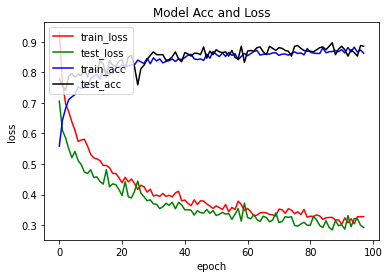

18/18 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

           0       0.89      0.77      0.82       184
           1       0.96      0.94      0.95       177
           2       0.83      0.96      0.89       184

    accuracy                           0.89       545
   macro avg       0.89      0.89      0.89       545
weighted avg       0.89      0.89      0.89       545



In [69]:
run_robust_test(0, x, y)

0.0118144750254842
[10, 45, 55, 58, 94, 106, 131, 132, 163, 203, 254, 294, 327, 343, 347, 372, 385, 390, 426, 489, 507, 540, 546, 560, 563, 564, 566, 580, 598, 600, 609, 638, 663, 684, 699, 709, 725, 756, 770, 787, 840, 880, 923, 941, 954, 961, 965, 971, 986, 991, 992, 1001, 1041, 1067, 1078, 1094, 1105, 1160, 1180, 1193, 1203, 1225, 1269, 1287, 1303, 1325, 1327, 1355, 1384, 1417, 1425, 1426, 1495, 1528, 1551, 1552, 1604, 1614, 1616, 1626, 1644, 1661, 1670, 1713, 1719, 1750, 1800, 1817, 1848, 1886, 1911, 1914, 1951, 2063, 2066, 2106, 2117, 2122, 2140, 2189, 2252, 2255, 2282, 2296, 2314, 2331, 2373, 2399, 2451, 2473, 2474, 2497, 2527, 2549, 2565, 2572, 2593, 2618, 2652, 2683, 2692, 2700, 2719, 2741, 2757, 2763, 2764, 2775, 2784, 2808, 2831, 2840, 2862, 2866, 2867, 2880, 2886, 2904, 2944, 2978, 3030, 3042, 3057, 3059, 3084, 3175, 3188, 3194, 3217, 3243, 3246, 3249, 3287, 3304, 3306, 3322, 3338, 3350, 3391, 3426, 3458, 3491, 3494, 3495, 3528, 3558, 3567, 3576, 3656, 3660, 3700, 3716, 3752

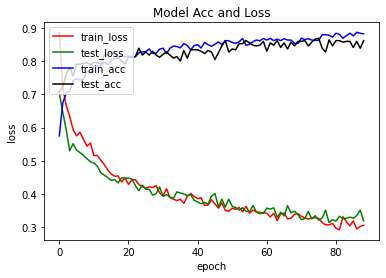

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.86      0.76      0.81       184
           1       0.93      0.95      0.94       177
           2       0.84      0.92      0.88       184

    accuracy                           0.88       545
   macro avg       0.88      0.88      0.88       545
weighted avg       0.88      0.88      0.88       545



In [70]:
run_robust_test(0.05, x, y)

0.0118144750254842
[17, 23, 40, 48, 50, 54, 57, 68, 72, 89, 93, 95, 122, 126, 129, 131, 156, 157, 164, 177, 179, 182, 204, 210, 231, 233, 238, 247, 248, 251, 265, 267, 273, 307, 327, 339, 340, 348, 352, 367, 372, 381, 382, 387, 397, 410, 421, 445, 458, 467, 511, 513, 529, 534, 583, 589, 607, 615, 623, 655, 668, 694, 696, 724, 731, 734, 737, 751, 762, 767, 771, 775, 777, 788, 810, 820, 832, 842, 854, 864, 866, 874, 909, 918, 929, 941, 945, 946, 949, 958, 963, 972, 983, 986, 998, 1007, 1017, 1022, 1028, 1045, 1060, 1077, 1086, 1108, 1123, 1129, 1135, 1136, 1154, 1158, 1159, 1164, 1174, 1177, 1179, 1212, 1214, 1235, 1237, 1245, 1261, 1289, 1293, 1310, 1321, 1330, 1339, 1380, 1381, 1396, 1398, 1415, 1421, 1427, 1432, 1462, 1468, 1480, 1490, 1515, 1538, 1543, 1557, 1559, 1577, 1592, 1596, 1607, 1612, 1616, 1619, 1621, 1630, 1635, 1640, 1644, 1645, 1652, 1658, 1662, 1671, 1674, 1676, 1678, 1681, 1684, 1698, 1708, 1709, 1714, 1716, 1744, 1745, 1767, 1769, 1775, 1778, 1806, 1815, 1820, 1834, 1

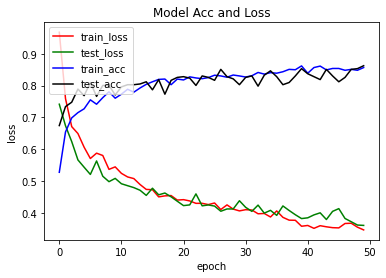

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.84      0.70      0.76       184
           1       0.90      0.95      0.92       177
           2       0.82      0.91      0.87       184

    accuracy                           0.85       545
   macro avg       0.85      0.85      0.85       545
weighted avg       0.85      0.85      0.85       545



In [62]:
run_robust_test(0.1, x, y)

0.0118144750254842
[9, 12, 16, 18, 23, 31, 33, 43, 57, 67, 74, 79, 82, 91, 92, 97, 99, 105, 110, 116, 123, 132, 148, 149, 150, 169, 176, 184, 201, 204, 217, 225, 227, 234, 238, 240, 247, 249, 252, 258, 263, 286, 287, 293, 298, 303, 310, 315, 321, 327, 333, 336, 337, 340, 342, 349, 352, 354, 363, 367, 376, 397, 400, 417, 418, 421, 430, 432, 440, 451, 461, 465, 479, 482, 498, 500, 501, 503, 507, 510, 518, 522, 523, 525, 527, 541, 544, 549, 551, 553, 563, 564, 586, 588, 594, 595, 618, 643, 647, 652, 655, 656, 664, 673, 676, 686, 687, 694, 698, 701, 702, 724, 726, 727, 737, 740, 743, 747, 750, 757, 763, 773, 775, 798, 800, 802, 803, 812, 813, 814, 815, 818, 820, 827, 833, 838, 857, 859, 862, 868, 873, 875, 890, 898, 911, 912, 914, 915, 918, 926, 929, 936, 940, 941, 951, 957, 963, 965, 968, 978, 983, 988, 991, 994, 1022, 1030, 1036, 1047, 1050, 1057, 1058, 1068, 1089, 1092, 1100, 1119, 1127, 1128, 1140, 1147, 1150, 1154, 1159, 1160, 1165, 1168, 1171, 1189, 1206, 1207, 1209, 1218, 1220, 1223

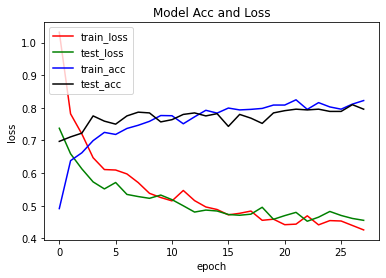

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.78      0.66      0.71       184
           1       0.91      0.88      0.90       177
           2       0.78      0.93      0.85       184

    accuracy                           0.82       545
   macro avg       0.82      0.82      0.82       545
weighted avg       0.82      0.82      0.82       545



In [53]:
run_robust_test(0.15, x, y)

0.0118144750254842
[6, 22, 31, 37, 39, 43, 52, 53, 57, 62, 68, 69, 70, 75, 91, 93, 94, 104, 110, 112, 114, 116, 119, 125, 131, 135, 144, 148, 155, 156, 158, 169, 188, 190, 200, 203, 206, 209, 216, 221, 226, 228, 229, 230, 234, 238, 245, 248, 249, 257, 262, 269, 273, 276, 280, 289, 291, 305, 314, 317, 319, 322, 325, 333, 335, 336, 338, 339, 340, 356, 363, 372, 373, 378, 383, 393, 399, 404, 408, 410, 411, 413, 423, 427, 430, 434, 435, 438, 442, 445, 449, 450, 456, 459, 473, 476, 478, 480, 488, 489, 492, 500, 509, 512, 524, 542, 547, 552, 557, 558, 567, 578, 580, 581, 585, 599, 607, 608, 612, 616, 620, 622, 629, 637, 638, 639, 647, 649, 655, 664, 666, 667, 668, 677, 679, 686, 693, 697, 704, 708, 732, 735, 757, 759, 761, 766, 767, 770, 772, 773, 784, 791, 793, 801, 805, 808, 822, 826, 827, 828, 834, 839, 843, 854, 856, 860, 867, 868, 873, 885, 891, 892, 893, 895, 899, 902, 903, 907, 915, 928, 938, 941, 946, 956, 957, 960, 961, 962, 963, 974, 975, 982, 986, 988, 998, 1002, 1003, 1004, 1009,

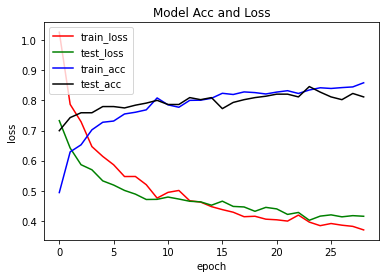

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.77      0.72      0.74       184
           1       0.88      0.94      0.91       177
           2       0.84      0.84      0.84       184

    accuracy                           0.83       545
   macro avg       0.83      0.83      0.83       545
weighted avg       0.83      0.83      0.83       545



In [54]:
run_robust_test(0.2, x, y)

0.0118144750254842
[4, 15, 22, 24, 26, 27, 28, 30, 33, 36, 51, 52, 56, 58, 60, 68, 70, 74, 90, 93, 97, 108, 112, 113, 122, 127, 141, 144, 147, 154, 156, 159, 160, 161, 162, 163, 168, 173, 174, 176, 193, 210, 211, 214, 222, 226, 231, 232, 235, 236, 237, 241, 244, 250, 253, 254, 262, 264, 265, 267, 268, 270, 272, 273, 282, 284, 287, 294, 296, 300, 301, 303, 304, 306, 307, 309, 310, 311, 318, 320, 323, 329, 331, 335, 337, 338, 345, 352, 356, 357, 360, 370, 374, 381, 383, 389, 399, 410, 415, 416, 418, 427, 434, 438, 439, 441, 443, 448, 452, 454, 456, 458, 464, 469, 470, 471, 478, 486, 488, 496, 500, 504, 510, 512, 513, 516, 519, 528, 529, 539, 540, 541, 544, 546, 548, 552, 559, 566, 569, 573, 580, 585, 595, 598, 599, 609, 610, 612, 613, 615, 616, 617, 620, 621, 626, 629, 630, 631, 635, 637, 639, 647, 653, 661, 663, 664, 667, 684, 690, 697, 701, 706, 707, 708, 715, 717, 718, 719, 725, 727, 744, 747, 748, 752, 753, 761, 765, 772, 773, 776, 787, 790, 792, 793, 794, 802, 804, 809, 811, 814, 81

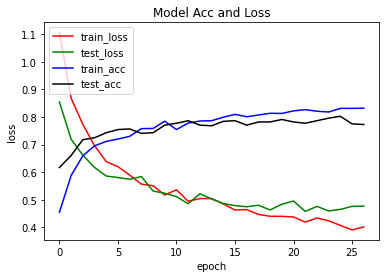

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.74      0.62      0.67       184
           1       0.86      0.88      0.87       177
           2       0.78      0.89      0.83       184

    accuracy                           0.80       545
   macro avg       0.79      0.80      0.79       545
weighted avg       0.79      0.80      0.79       545



In [55]:
run_robust_test(0.25, x, y)

0.0118144750254842
[0, 1, 7, 12, 13, 17, 20, 21, 22, 31, 38, 39, 40, 41, 49, 50, 58, 60, 62, 65, 67, 68, 70, 81, 85, 87, 88, 89, 95, 101, 108, 113, 116, 122, 125, 128, 130, 131, 132, 133, 143, 144, 150, 156, 158, 161, 164, 165, 167, 168, 173, 176, 177, 182, 184, 187, 189, 191, 197, 198, 199, 200, 209, 211, 212, 213, 216, 223, 224, 227, 229, 231, 235, 245, 247, 249, 255, 259, 260, 265, 268, 272, 279, 280, 281, 289, 293, 294, 301, 305, 311, 312, 313, 319, 322, 324, 327, 330, 331, 333, 335, 337, 341, 342, 349, 351, 352, 360, 366, 369, 371, 372, 373, 379, 381, 386, 403, 410, 419, 421, 425, 426, 433, 434, 436, 439, 440, 441, 442, 445, 446, 449, 451, 453, 455, 460, 461, 464, 467, 474, 475, 482, 485, 487, 494, 500, 506, 509, 510, 515, 517, 526, 529, 531, 539, 540, 547, 548, 551, 553, 554, 556, 557, 559, 562, 564, 565, 566, 567, 575, 579, 581, 582, 592, 593, 600, 601, 603, 605, 612, 629, 631, 633, 637, 644, 647, 652, 653, 656, 661, 666, 667, 671, 677, 681, 683, 687, 693, 699, 704, 705, 706, 70

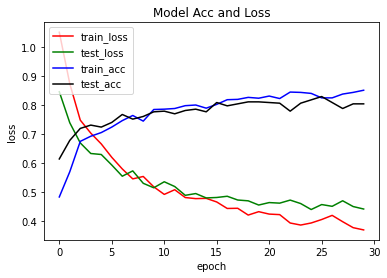

18/18 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

           0       0.77      0.65      0.71       184
           1       0.88      0.89      0.89       177
           2       0.80      0.91      0.85       184

    accuracy                           0.82       545
   macro avg       0.82      0.82      0.82       545
weighted avg       0.82      0.82      0.81       545



In [56]:
run_robust_test(0.3, x, y)

0.0118144750254842
[4, 5, 8, 9, 10, 11, 13, 23, 24, 25, 34, 41, 42, 44, 45, 48, 50, 53, 54, 55, 61, 64, 67, 69, 83, 85, 86, 89, 91, 94, 95, 98, 100, 106, 108, 109, 110, 112, 113, 120, 123, 126, 129, 130, 133, 134, 138, 139, 145, 146, 153, 157, 162, 174, 175, 176, 178, 182, 183, 184, 189, 195, 196, 197, 198, 200, 205, 207, 211, 214, 216, 218, 219, 222, 223, 225, 226, 228, 230, 234, 235, 237, 244, 252, 263, 276, 277, 280, 283, 286, 287, 291, 293, 297, 301, 302, 304, 307, 308, 310, 317, 319, 320, 321, 323, 326, 327, 331, 333, 336, 338, 340, 342, 344, 345, 347, 348, 349, 350, 353, 356, 358, 360, 361, 364, 365, 368, 369, 373, 375, 376, 377, 378, 379, 380, 381, 383, 385, 387, 391, 394, 395, 398, 402, 404, 409, 411, 414, 415, 421, 422, 423, 434, 441, 442, 445, 448, 450, 455, 456, 462, 464, 465, 470, 471, 475, 476, 479, 480, 481, 483, 498, 508, 511, 513, 515, 516, 523, 527, 529, 531, 535, 536, 538, 540, 547, 548, 549, 551, 552, 553, 554, 556, 559, 566, 579, 583, 585, 586, 587, 592, 593, 597, 5

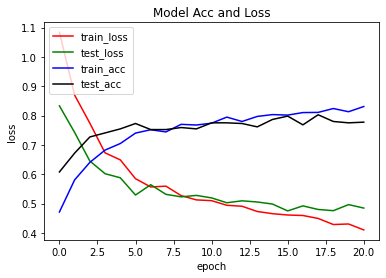

18/18 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

           0       0.73      0.59      0.65       184
           1       0.83      0.94      0.89       177
           2       0.78      0.84      0.81       184

    accuracy                           0.79       545
   macro avg       0.78      0.79      0.78       545
weighted avg       0.78      0.79      0.78       545



In [57]:
run_robust_test(0.35, x, y)

0.0118144750254842
[3, 5, 6, 8, 9, 10, 11, 19, 21, 26, 28, 32, 33, 34, 37, 44, 49, 50, 52, 57, 58, 60, 62, 69, 70, 71, 72, 74, 76, 77, 79, 81, 90, 95, 98, 99, 101, 106, 111, 113, 115, 121, 122, 124, 126, 127, 129, 130, 133, 135, 137, 139, 140, 141, 143, 145, 147, 149, 153, 157, 158, 160, 162, 168, 172, 174, 176, 177, 178, 181, 183, 184, 187, 189, 190, 191, 192, 194, 196, 198, 201, 202, 204, 211, 212, 213, 215, 216, 221, 223, 226, 229, 230, 232, 234, 236, 239, 240, 241, 245, 248, 249, 252, 259, 261, 262, 263, 264, 266, 269, 270, 271, 272, 273, 278, 279, 283, 287, 288, 289, 290, 293, 297, 303, 304, 305, 306, 310, 312, 313, 314, 317, 319, 328, 330, 334, 335, 340, 341, 345, 346, 351, 352, 353, 354, 355, 356, 358, 359, 362, 363, 364, 368, 373, 382, 384, 388, 389, 390, 392, 393, 395, 400, 406, 409, 413, 415, 418, 419, 421, 423, 424, 427, 431, 432, 433, 436, 440, 442, 444, 445, 446, 447, 450, 452, 457, 459, 461, 464, 469, 471, 480, 482, 485, 487, 489, 494, 495, 496, 499, 502, 503, 506, 507, 5

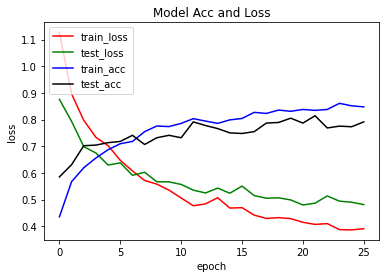

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.70      0.66      0.68       184
           1       0.91      0.85      0.88       177
           2       0.77      0.86      0.81       184

    accuracy                           0.79       545
   macro avg       0.79      0.79      0.79       545
weighted avg       0.79      0.79      0.79       545



In [58]:
run_robust_test(0.4, x, y)

0.0118144750254842
[8, 11, 12, 13, 14, 15, 21, 22, 26, 27, 29, 31, 33, 34, 35, 37, 39, 44, 46, 51, 56, 59, 60, 63, 66, 67, 76, 78, 84, 85, 86, 87, 91, 92, 93, 97, 99, 101, 106, 108, 109, 113, 114, 115, 116, 117, 120, 121, 122, 128, 129, 130, 131, 132, 133, 134, 137, 138, 139, 141, 143, 145, 147, 154, 155, 160, 161, 164, 165, 166, 167, 170, 171, 173, 174, 179, 180, 181, 187, 188, 191, 192, 194, 195, 199, 203, 205, 206, 207, 210, 211, 219, 223, 225, 228, 230, 231, 232, 233, 238, 241, 244, 247, 252, 253, 254, 257, 259, 260, 263, 265, 266, 267, 268, 272, 273, 276, 277, 278, 279, 282, 285, 287, 291, 292, 295, 297, 298, 299, 310, 311, 315, 318, 319, 320, 321, 323, 328, 331, 332, 333, 335, 337, 338, 339, 340, 341, 344, 345, 349, 352, 354, 356, 357, 358, 360, 361, 362, 364, 370, 372, 374, 375, 376, 378, 379, 380, 384, 385, 387, 388, 390, 394, 396, 398, 399, 400, 401, 403, 413, 414, 415, 417, 420, 421, 427, 428, 429, 430, 431, 432, 433, 435, 437, 439, 440, 441, 442, 444, 445, 447, 448, 454, 455

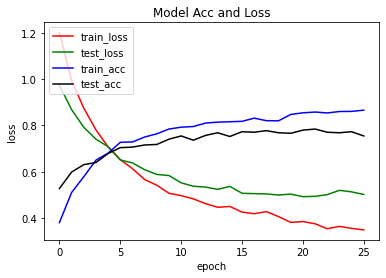

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.65      0.56      0.60       184
           1       0.81      0.90      0.86       177
           2       0.76      0.79      0.78       184

    accuracy                           0.75       545
   macro avg       0.74      0.75      0.74       545
weighted avg       0.74      0.75      0.74       545



In [59]:
run_robust_test(0.45, x, y)

0.0118144750254842
[0, 2, 6, 7, 9, 10, 13, 14, 15, 20, 22, 26, 27, 31, 35, 36, 38, 39, 42, 43, 47, 48, 51, 52, 54, 55, 57, 62, 67, 71, 73, 74, 75, 77, 78, 79, 83, 84, 85, 89, 91, 92, 93, 96, 97, 98, 99, 104, 105, 108, 109, 111, 112, 113, 114, 115, 116, 117, 119, 122, 123, 125, 127, 128, 129, 135, 137, 144, 146, 149, 150, 151, 154, 156, 157, 158, 159, 160, 162, 164, 165, 167, 171, 175, 177, 179, 183, 185, 186, 188, 189, 190, 192, 196, 197, 200, 201, 202, 203, 205, 207, 208, 209, 210, 212, 221, 223, 226, 227, 228, 229, 231, 232, 233, 234, 236, 238, 240, 241, 242, 243, 246, 247, 248, 249, 254, 255, 256, 257, 259, 260, 263, 265, 266, 267, 268, 273, 274, 279, 281, 286, 287, 292, 293, 295, 297, 298, 299, 300, 302, 303, 304, 305, 309, 311, 312, 315, 317, 321, 323, 324, 325, 326, 327, 328, 329, 330, 332, 336, 337, 338, 340, 341, 342, 345, 348, 350, 354, 355, 357, 358, 360, 361, 363, 365, 366, 368, 370, 371, 373, 376, 377, 379, 381, 383, 386, 387, 388, 389, 391, 393, 394, 397, 403, 404, 407, 40

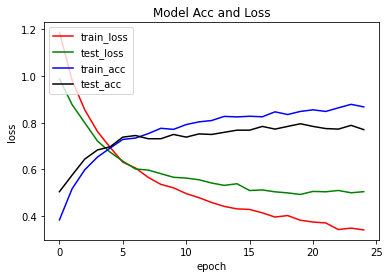

18/18 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

           0       0.67      0.70      0.68       184
           1       0.90      0.87      0.89       177
           2       0.79      0.79      0.79       184

    accuracy                           0.78       545
   macro avg       0.79      0.78      0.79       545
weighted avg       0.79      0.78      0.78       545



In [61]:
run_robust_test(0.5, x, y)